<a href="https://colab.research.google.com/github/thesyzling/first_ai_project/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("Tf version:", tf.__version__ )
print("Hub version:", hub.__version__ )
print("GPU", "Avaliable:" if tf.config.list_physical_devices("GPU") else "No gpu")

Tf version: 2.18.0
Hub version: 0.16.1
GPU Avaliable:


In [ ]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

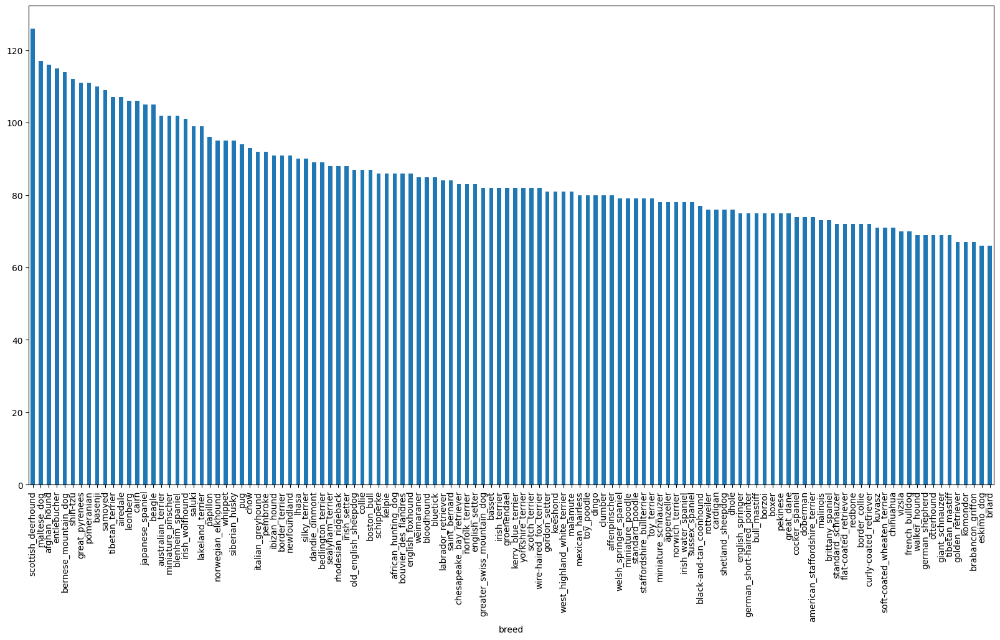

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize = (20, 10))

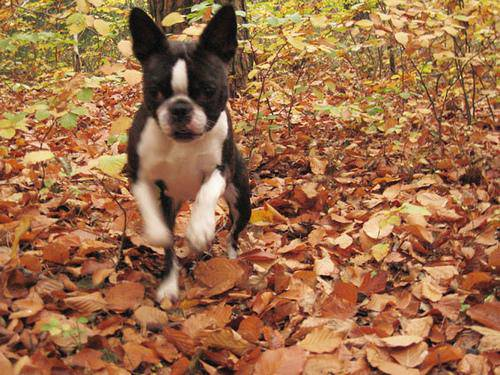

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files")

Filenames match actual amount of files!


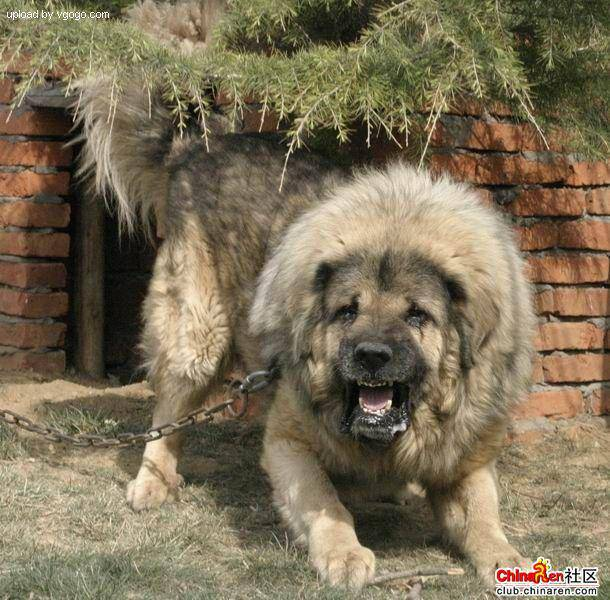

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of files doesn't match numbers")

Number of labels matches number of filenames


In [ ]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

np.random.seed(42)

X_train , X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state = 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

In [ ]:
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor
  """
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))

    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.0509804 , 0.0509804 , 0.0509804 ],
          [0.0509804 , 0.0509804 , 0.0509804 ],
          [0.0509804 , 0.0509804 , 0.0509804 ],
          ...,
          [0.18340975, 0.18733133, 0.16380191],
          [0.18572299, 0.18180141, 0.17131472],
          [0.16329621, 0.15937464, 0.15051652]],
 
         [[0.0509804 , 0.0509804 , 0.0509804 ],
          [0.0509804 , 0.0509804 , 0.0509804 ],
          [0.0509804 , 0.0509804 , 0.0509804 ],
          ...,
          [0.18778889, 0.19171046, 0.16818103],
          [0.17583156, 0.17191663, 0.15228885],
          [0.15927866, 0.1553739 , 0.1381046 ]],
 
         [[0.0509804 , 0.0509804 , 0.0509804 ],
          [0.0509804 , 0.0509804 , 0.0509804 ],
          [0.0509804 , 0.0509804 , 0.0509804 ],
          ...,
          [0.16271885, 0.16664042, 0.143111  ],
          [0.16926643, 0.16821954, 0.13917182],
          [0.16196598, 0.16120562, 0.13005063]],
 
         ...,
 
         [[0.38458222, 0.4277195 , 0.2660248 ],
          [0.35949

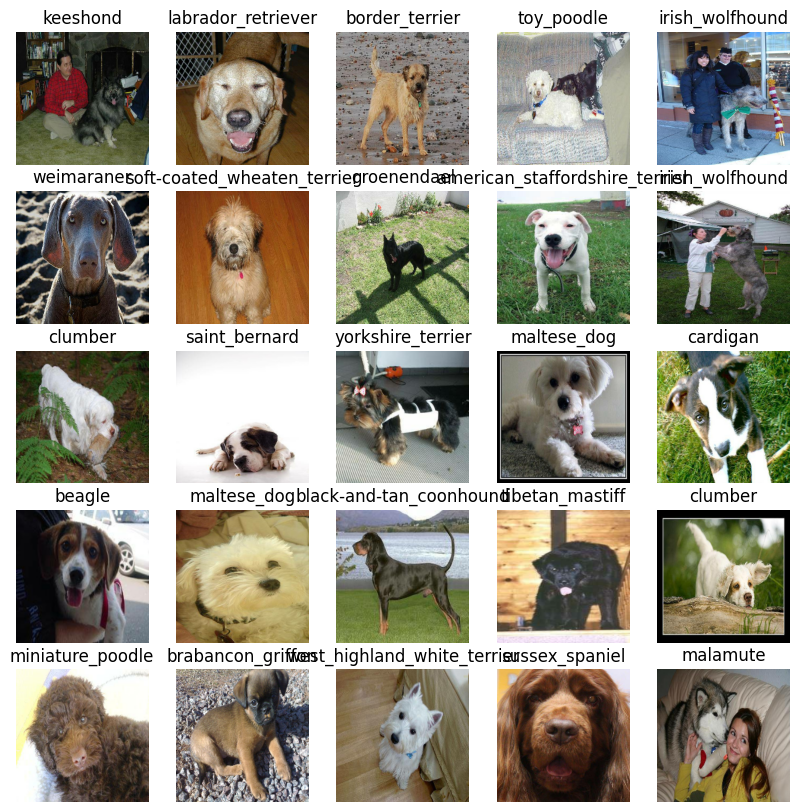

In [ ]:
show_25_images(train_images, train_labels)

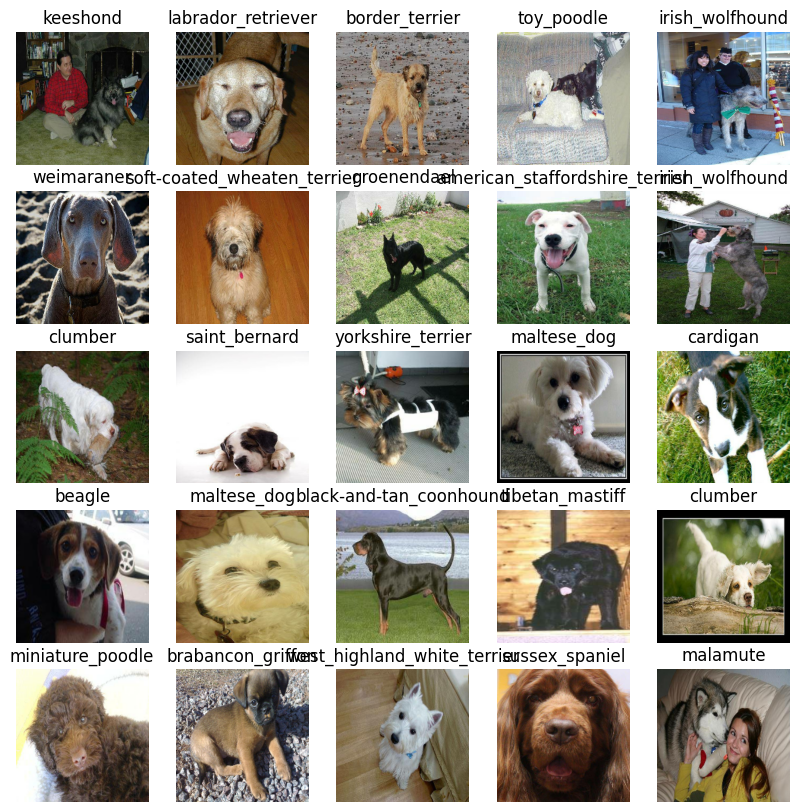

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

In [ ]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)
  hubs_layer = hub.KerasLayer(MODEL_URL)

  model = tf.keras.Sequential([
    tf.keras.layers.Lambda(lambda x: hubs_layer(x)), # Layer 1 (input layer)

    tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # Layer 2 (output layer)

    ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                 │ (None, 1001)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       120,240 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3 )

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
print("GPU","Avaliable (YES)" if tf.config.list_physical_devices("GPU") else "not avaliable" )

GPU Avaliable (YES)


In [ ]:
def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data, validation_freq =1, callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 234s 9s/step - accuracy: 0.0524 - loss: 4.9260 - val_accuracy: 0.2800 - val_loss: 3.3502
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.6576 - loss: 1.8405 - val_accuracy: 0.5300 - val_loss: 2.1573
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - accuracy: 0.9373 - loss: 0.5884 - val_accuracy: 0.5950 - val_loss: 1.6676
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - accuracy: 0.9862 - loss: 0.2591 - val_accuracy: 0.6400 - val_loss: 1.4955
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - accuracy: 0.9957 - loss: 0.1565 - val_accuracy: 0.6400 - val_loss: 1.4319
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - accuracy: 1.0000 - loss: 0.0983 - val_accuracy: 0.6600 - val_loss: 1.3843
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - accuracy: 1.0000 - loss: 0.0774 - val_accuracy: 0.6600 - val_loss: 1

In [ ]:
%load_ext tensorboard
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 547ms/step


array([[4.35385108e-03, 8.64454996e-05, 1.57390360e-03, ...,
        6.86076746e-05, 3.90209643e-05, 2.27239472e-03],
       [7.39400601e-03, 6.22602529e-04, 1.87139232e-02, ...,
        4.46616468e-04, 1.18753791e-03, 3.93177674e-04],
       [1.72637901e-05, 4.43718134e-04, 1.04364291e-04, ...,
        3.74062220e-05, 1.44464560e-04, 8.89262417e-04],
       ...,
       [1.55570578e-05, 2.25194162e-05, 4.54341534e-05, ...,
        7.44967247e-06, 7.89086553e-05, 2.01248986e-05],
       [1.33294042e-03, 1.18192766e-04, 8.44712922e-05, ...,
        2.94626770e-05, 1.25389823e-04, 9.36448853e-03],
       [6.44980581e-04, 9.45497086e-05, 2.89267185e-03, ...,
        1.42535390e-02, 5.52266790e-03, 5.19143614e-05]], dtype=float32)

In [ ]:
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Index of max value: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.53081198e-05 3.97494769e-05 2.94369947e-05 7.12991050e-06
 2.08989135e-03 8.61275257e-05 1.05765241e-04 1.04292110e-03
 4.79873270e-03 2.70870086e-02 9.45458214e-06 5.63010371e-06
 2.70336634e-04 2.38081114e-03 3.51414026e-04 2.47134338e-03
 1.87369351e-05 1.98309732e-04 7.76417728e-05 2.14068132e-04
 6.14869787e-05 1.84382850e-04 3.18030652e-05 2.12204523e-05
 2.71928939e-03 1.80798612e-04 3.36537087e-05 8.52517405e-05
 1.20684876e-04 2.02375395e-05 7.28378727e-05 7.21736578e-05
 4.24132922e-05 8.03888179e-06 8.46036710e-06 1.32470386e-05
 7.04215854e-05 6.87918437e-05 7.43879646e-05 4.71595347e-01
 5.50517980e-05 7.39032748e-06 5.99081255e-03 1.71448949e-06
 1.21607416e-04 3.57617537e-05 3.58434263e-05 3.00476473e-04
 5.19798505e-06 1.24355502e-04 9.59030513e-05 3.86954162e-05
 1.56119757e-04 4.26933495e-03 5.93596815e-06 1.69554987e-04
 5.00922106e-05 8.76037302e-05 5.08607227e-05 2.88479550e-05
 1.19818751e-05 2.76275852e-04 2.08404981e-05 3.19409119e-05
 1.89019447e-05 2.273849

In [ ]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[10])
pred_label

'yorkshire_terrier'

In [ ]:
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)

  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_ = []
labels_ = []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n):
    pred_prob = prediction_probabilities[n]
    true_label = labels[n]
    image = images[n]
    pred_label = get_pred_label(pred_prob)

    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Handle one-hot or scalar labels
    if isinstance(true_label, (np.ndarray, list)):
        true_label = np.argmax(true_label)

    color = "green" if pred_label == true_label else "red"
    plt.title(
        "{} {:.0f}% ({})".format(
            pred_label, 100 * np.max(pred_prob),
            "Correct" if pred_label == true_label else "Wrong"
        ),
        color=color
    )


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    pred_prob = prediction_probabilities[n]
    true_label = labels[n]
    pred_label = get_pred_label(pred_prob)

    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    bars = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="gray")
    plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

    # Handle scalar or one-hot encoded true label
    if isinstance(true_label, (np.ndarray, list)):
        true_label = np.argmax(true_label)

    if true_label in top_10_pred_indexes:
        bar_index = np.where(top_10_pred_indexes == true_label)[0][0]
        bars[bar_index].set_color("green")
    else:
        bars[0].set_color("red")  # optional fallback


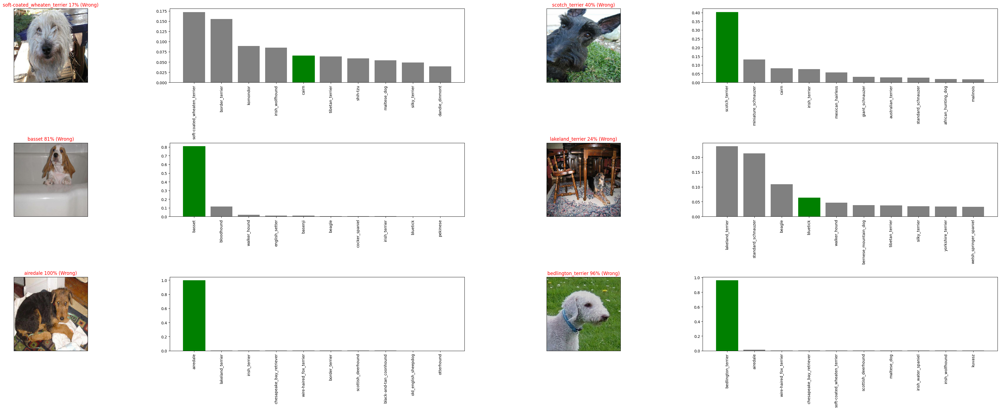

In [ ]:
val_images = images_
val_labels = labels_

i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize=(10*2*num_cols, 5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=i_multiplier+i)

    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=i_multiplier+i)

plt.tight_layout(h_pad=1.0)
plt.show()


In [ ]:
def save_model(model, suffix=None):
  modeldir = os.path.join("drive/My Drive/Dog Vision/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".keras"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  print(f"Loading saved model from:",{model_path})
  # Load the model from the SavedModel format
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20250524-222408-1000-images-mobilenetv2-Adam.keras...


'drive/My Drive/Dog Vision/models/20250524-222408-1000-images-mobilenetv2-Adam.keras'

## Full data

In [ ]:
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [ ]:
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 50s 134ms/step - accuracy: 0.4944 - loss: 2.3670
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 73s 112ms/step - accuracy: 0.8853 - loss: 0.4041
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - accuracy: 0.9377 - loss: 0.2316
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - accuracy: 0.9666 - loss: 0.1421
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - accuracy: 0.9806 - loss: 0.1025
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - accuracy: 0.9907 - loss: 0.0691
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 122ms/step - accuracy: 0.9930 - loss: 0.0560
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - accuracy: 0.9962 - loss: 0.0412
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - accuracy: 0.9967 - loss: 0.0364
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - accuracy: 0.9972 - loss: 0.0285
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - accuracy: 0.9979 - loss: 0.0250
Epoch 12

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20250524-223841-full-image-set-mobilenetv2-Adam.keras...


'drive/My Drive/Dog Vision/models/20250524-223841-full-image-set-mobilenetv2-Adam.keras'

In [ ]:
from keras.models import load_model
import keras
import tensorflow_hub as hub

keras.config.enable_unsafe_deserialization()

custom_objects = {
    'KerasLayer': hub.KerasLayer
}

loaded_full_model = load_model(
    "drive/My Drive/Dog Vision/models/20250524-223841-full-image-set-mobilenetv2-Adam.keras",
    custom_objects=custom_objects,
    safe_mode=False
)


In [ ]:
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/e713f150e4f9fc828f8a28705755f199.jpg',
 'drive/My Drive/Dog Vision/test/e265af5e8f446888c6e7ec31f803d63e.jpg',
 'drive/My Drive/Dog Vision/test/e18c30f7ba3680d75ff326ccb71642e0.jpg',
 'drive/My Drive/Dog Vision/test/e2628b6bde028b5eb593616128728907.jpg',
 'drive/My Drive/Dog Vision/test/e2faaf5e760a6189d0980e6355864b4c.jpg',
 'drive/My Drive/Dog Vision/test/e411a1b3681604f6321af7cb8e8f2de7.jpg',
 'drive/My Drive/Dog Vision/test/dfc5d207b533d381045984a0a0adb23c.jpg',
 'drive/My Drive/Dog Vision/test/de2c6675c001726a96ad9d72ab229f3a.jpg',
 'drive/My Drive/Dog Vision/test/e27567e188000db387977cdb9bbdcf82.jpg',
 'drive/My Drive/Dog Vision/test/df99a948e43d3399aff2e8ab2c18e184.jpg']

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = loaded_full_model.predict(test_data, verbose=1)

TypeError: Exception encountered when calling Lambda.call().

[1m'dict' object is not callable[0m

Arguments received by Lambda.call():
  • inputs=tf.Tensor(shape=(32, 224, 224, 3), dtype=float32)
  • mask=None
  • training=False